Reanalysis of [No evidence for correlations between handgrip strength and sexually dimorphic acoustic properties of voices](https://www.biorxiv.org/content/early/2017/11/30/227165).  
Data and R code see https://osf.io/na2sb/

## Environment setups

In [1]:
import os

import numpy as np
import pandas as pd
import seaborn as sns
import pymc3 as pm
import theano.tensor as tt

%pylab inline
%config InlineBackend.figure_format = 'retina'
%load_ext watermark

plt.style.use('ggplot')

/Library/Frameworks/Python.framework/Versions/3.5/lib/python3.5/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters


Populating the interactive namespace from numpy and matplotlib


In [2]:
%watermark -v -m -p numpy,pandas,seaborn,pymc3,matplotlib

CPython 3.5.1
IPython 6.2.1

numpy 1.14.3
pandas 0.21.0
seaborn 0.8.1
pymc3 3.4.1
matplotlib 2.1.0

compiler   : GCC 4.2.1 (Apple Inc. build 5666) (dot 3)
system     : Darwin
release    : 17.5.0
machine    : x86_64
processor  : i386
CPU cores  : 4
interpreter: 64bit


## Load data, display descriptive result
We tested the putative relationships between White UK (N=115) and Chinese (N=106) participants' handgrip strength (a widely used proxy for general upper-body strength) and five sexually dimorphic acoustic properties of voices: fundamental frequency (F0), fundamental frequency's standard deviation (F0-SD), formant dispersion (Df), formant position (Pf), and estimated vocal-tract length (VTL).

In [3]:
tbl = pd.read_csv('final_dataset.csv', ',')
tbl.head()

,ID,sex,age,ethnicity,HGS,F0,F0SD,Df_Puts,Pf_Puts,VTL_Reby
0,4,male,19.0,Chinese,45.5,114.5832,14.0137,996.500000,-0.175121,15.923498
1,7,male,27.0,Chinese,31.0,147.4819,15.3037,981.033333,0.142022,15.779474
2,8,male,24.1,Chinese,40.0,123.3256,12.6864,977.000000,-0.781828,16.824111
3,19,male,22.5,Chinese,37.0,120.1835,12.5944,1036.966667,-0.375867,15.858461
4,21,male,20.1,Chinese,45.0,94.6771,27.3972,892.500000,-1.741636,18.364027


The main variables is handgrip strength (HGS) and acoustic properties of voices.

In [4]:
(tbl[['age', 'HGS', 'F0', 'F0SD', 'Df_Puts',
       'Pf_Puts', 'VTL_Reby']]
 .agg(['count', 'mean', 'std'])).T.round(3)

,count,mean,std
age,221.0,23.401,4.358
HGS,221.0,32.636,10.652
F0,221.0,166.269,55.524
F0SD,221.0,27.450,19.599
Df_Puts,221.0,1069.641,84.829
Pf_Puts,221.0,0.000,0.947
VTL_Reby,221.0,15.678,1.254


In [5]:
(tbl.groupby(['ethnicity', 'sex'])['age']
 .agg(['count'])).T.round(3)

ethnicity Chinese      White_UK     
sex        female male   female male
count          53   53       57   58

Descriptive data summary and display

In [6]:
def btCI(x):
    return sns.utils.ci(sns.algorithms.bootstrap(x, n_boot=1000))
def btCI_025(x):
    return btCI(x)[0]
def btCI_975(x):
    return btCI(x)[1]

In [7]:
(tbl.groupby(['ethnicity', 'sex'])[['age', 'HGS', 'F0', 'F0SD', 'Df_Puts',
       'Pf_Puts', 'VTL_Reby']]
 .agg(['mean', btCI_025, btCI_975, 'std'])).T.round(3)

ethnicity           Chinese            White_UK          
sex                  female      male    female      male
age      mean        24.104    24.843    21.830    22.986
         btCI_025    23.436    23.757    20.933    21.698
         btCI_975    24.889    26.016    22.786    24.548
         std          2.699     4.384     3.539     5.636
HGS      mean        23.566    41.170    24.939    40.690
         btCI_025    22.500    39.056    23.824    38.405
         btCI_975    24.594    43.426    26.114    42.750
         std          3.730     8.040     4.579     8.729
F0       mean       220.627   119.640   216.570   109.773
         btCI_025   214.774   115.882   211.041   105.329
         btCI_975   226.424   123.609   222.103   114.133
         std         21.884    14.758    21.067    16.747
F0SD     mean        40.028    13.146    43.134    13.614
         btCI_025    35.577    11.942    38.399    12.008
         btCI_975    44.946    14.459    48.419    15.221
         std         17.429     4.707    19.273     6.495
Df_Puts  mean      1141.819   995.988  1144.691   997.233
         btCI_025  1131.893   981.767  1134.513   986.785
         btCI_975  1151.612  1009.188  1154.563  1006.414
         std         36.814    51.130    42.537    38.974
Pf_Puts  mean         0.805    -0.805     0.843    -0.828
         btCI_025     0.684    -0.959     0.723    -0.934
         btCI_975     0.929    -0.661     0.956    -0.724
         std          0.448     0.551     0.468     0.411
VTL_Reby mean        14.473    16.657    14.674    16.872
         btCI_025    14.362    16.426    14.553    16.737
         btCI_975    14.589    16.923    14.797    17.008
         std          0.448     0.864     0.485     0.524

In [8]:
tbl['subgroup'] = tbl['ethnicity']+'-'+tbl['sex']

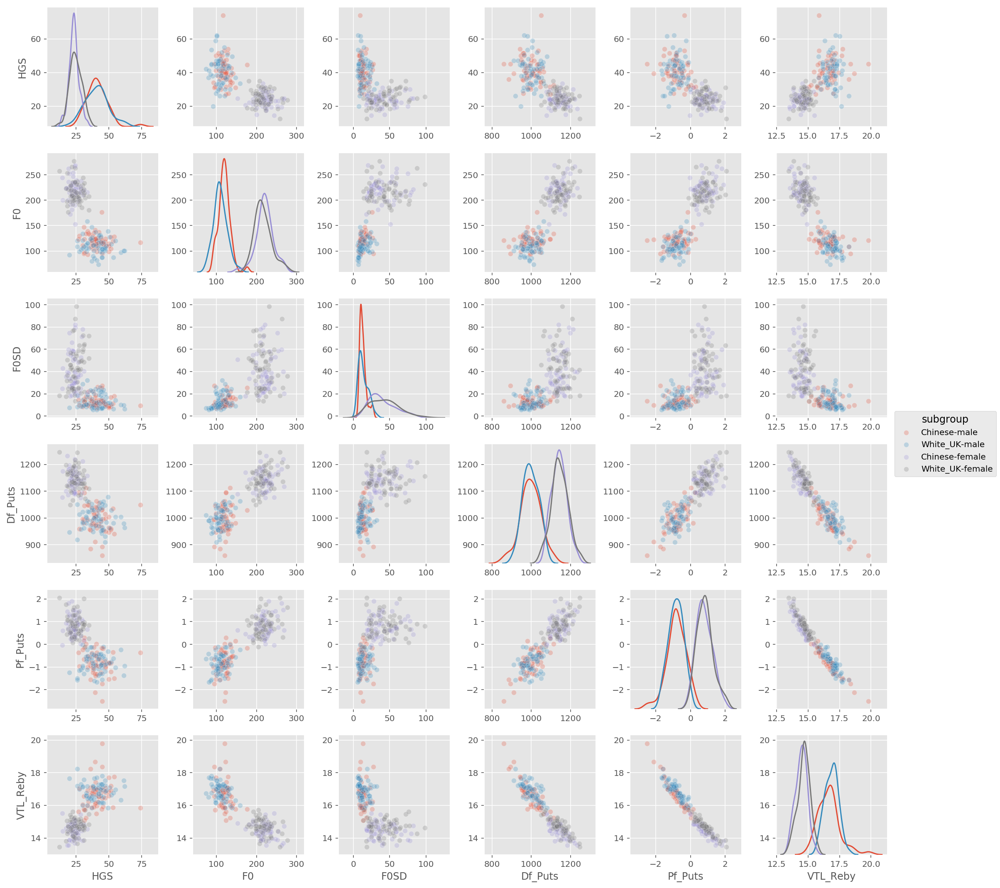

In [9]:
sns.pairplot(tbl, hue='subgroup', 
             vars=['HGS', 'F0', 'F0SD', 'Df_Puts', 'Pf_Puts', 'VTL_Reby'],
             diag_kind='kde',
             plot_kws=dict(alpha=.25));

## Mutivariate Model
In the original preprint, 5 different linear regressions are fitted. The linear regressions reported in the manuscript do not account for the repeated measurements of acoustic properties from each subject. Treating the five acoustic measures as the predictor does not properly quantify noise associated with the measurement. To address this issue, we performed a Bayesian analysis with a Multivariate latent model. Acoustics and handgrip strength within each participant are modeled as a realization of the a latent multivariate normal distribution, with the correlation matrix capturing the relationship between acoustics and handgrip strength. 

In [10]:
from patsy import dmatrices
_, X  = dmatrices("HGS ~ ethnicity*sex", data=tbl, return_type='matrix')
Terms = X.design_info.column_names
X = np.asarray(X) # design matrix
datamat = tbl[['HGS', 'F0', 'F0SD', 'Df_Puts', 'Pf_Puts', 'VTL_Reby']].values # data
nsbj, npredi = X.shape
Nmeasure = datamat.shape[1]
Terms

['Intercept',
 'ethnicity[T.White_UK]',
 'sex[T.male]',
 'ethnicity[T.White_UK]:sex[T.male]']

## Model 1 - Latent correlation model
### Non-centered parameterization
$$
\begin{align*}
R &
\sim \text{LKJCorr}(2)\\
\sigma &
\sim \text{HalfNormal}(50)\\
\text{Prior for coefficients}\\
\beta &
\sim \text{Normal}(0, 100)\\
\Sigma &
= diag(\sigma)*R*diag(\sigma)\\
\mu_{latent} &
\sim \text{MvNormal}(X\beta, \Sigma)\\
observed &
\sim \text{Normal}(\mu_{latent}, \sigma)
\end{align*}
$$

The latent measure follows a prior distribution defined by the six-dimensional Gaussian distribution with means $X\beta$ and covariance matrix cov. In practice, we parameterized the Cholesky decomposition of the covariance matrix. We then performed an affine transformation by multiplying the Cholesky factor of cov with a standard Normal and plus $X\beta$.

In [11]:
with pm.Model() as mv_model1:
    # prior for covariance
    sd_dist = pm.HalfNormal.dist(50)
    packed_chol = pm.LKJCholeskyCov('chol_cov', n=Nmeasure, eta=2, sd_dist=sd_dist)
    
    # compute the covariance and correlation matrix 
    chol = pm.expand_packed_triangular(Nmeasure, packed_chol, lower=True)
    cov = pm.Deterministic('cov', tt.dot(chol, chol.T))
    # Extract the standard deviations and rho
    sd = pm.Deterministic('sd', tt.sqrt(tt.diag(cov)))
    corr = pm.Deterministic('corr', tt.diag(sd**-1).dot(cov.dot(tt.diag(sd**-1))))
    
    beta = pm.Normal('beta', mu=0., sd=100., shape=(npredi, Nmeasure))
    mu_ = pm.Normal('mu_', mu=0., sd=1., shape=datamat.shape)
    mu_group = tt.dot(X, beta) + tt.dot(chol, mu_.T).T
    
    # sd = pm.HalfNormal('sd', 5, shape=Nmeasure)
    
    # observed
    obs = pm.Normal('observed', mu=mu_group, sd=sd, observed=datamat)
    
    trace1 = pm.sample(1000, tune=2000,
                       #nuts_kwargs=dict(target_accept=.95, max_treedepth=15)
                      )

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (2 chains in 2 jobs)
NUTS: [mu_, beta, chol_cov]
100%|██████████| 3000/3000 [13:06<00:00, 28.17it/s] 
The number of effective samples is smaller than 25% for some parameters.


The probabilistic model was built using PyMC3 and we sampled from the posterior distribution using No-U-Turn Sampler (NUTS). We ran four MCMC chains with 3000 samples. The first 1000 samples were used for tuning the mass matrix and step size for NUTS and were discarded following this. Model convergence was diagnosed by computing Gelman and Rubin's convergence diagnostic (R-hat, 1992), examining the effective sample size, inspecting the mixing of the traces, and checking whether there is any divergent sample that has been returned from the sampler.

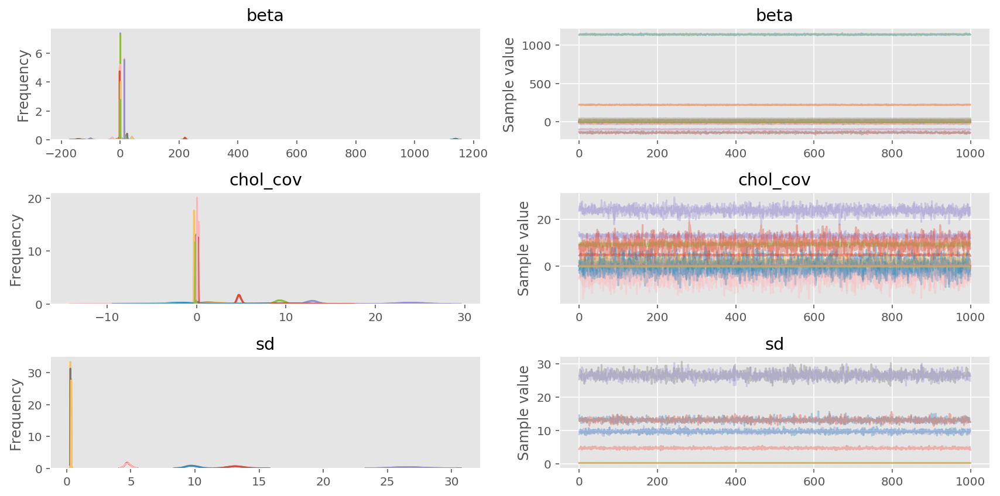

In [12]:
pm.traceplot(trace1, varnames=['beta', 'chol_cov', 'sd']);

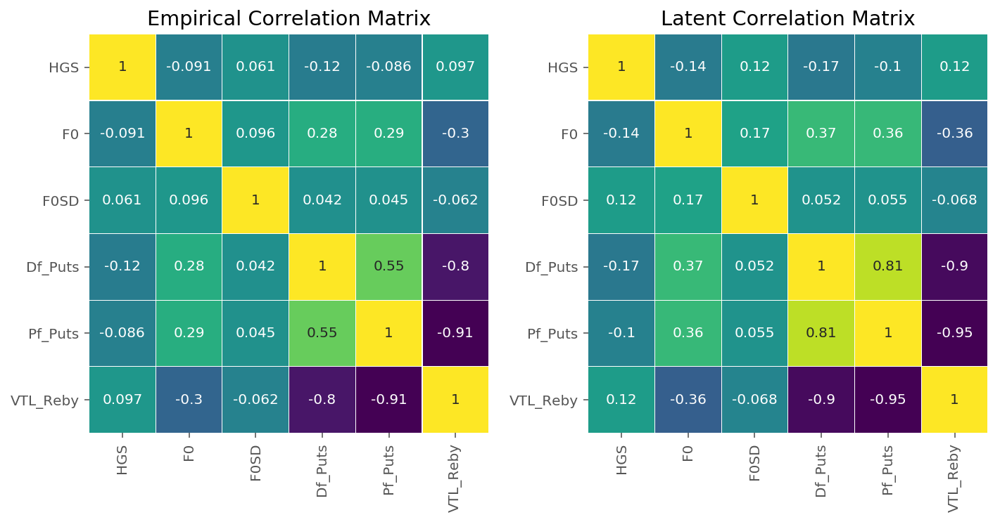

In [13]:
measure_labels = ['HGS', 'F0', 'F0SD', 'Df_Puts', 'Pf_Puts', 'VTL_Reby']

_, ax = plt.subplots(1, 2, figsize=(10, 5))

data_demean = np.zeros_like(datamat)
for ig in tbl['subgroup'].unique():
    data_demean[tbl['subgroup']==ig, :] = datamat[tbl['subgroup']==ig, :] - \
                                datamat[tbl['subgroup']==ig, :].mean(axis=0)

empirical_corr = pd.DataFrame(np.corrcoef(data_demean.T),
                             columns=measure_labels,
                             index=measure_labels)
sns.heatmap(empirical_corr, 
            cbar=False, square = True, annot=True, 
            linewidths=.1, cmap='viridis', ax=ax[0])
ax[0].set_title('Empirical Correlation Matrix')

posterior_corr = pd.DataFrame(trace1['corr'].mean(axis=0),
                             columns=measure_labels,
                             index=measure_labels)
sns.heatmap(posterior_corr, 
            cbar=False, square = True, annot=True, 
            linewidths=.1, cmap='viridis', ax=ax[1])
ax[1].set_title('Latent Correlation Matrix')

plt.tight_layout();

### Posterior distribution of the cross correlation
Similar conclusion to the paper could be drawn: The posterior distribution of the correlations between handgrip strength and acoustic measures overlap with zero.

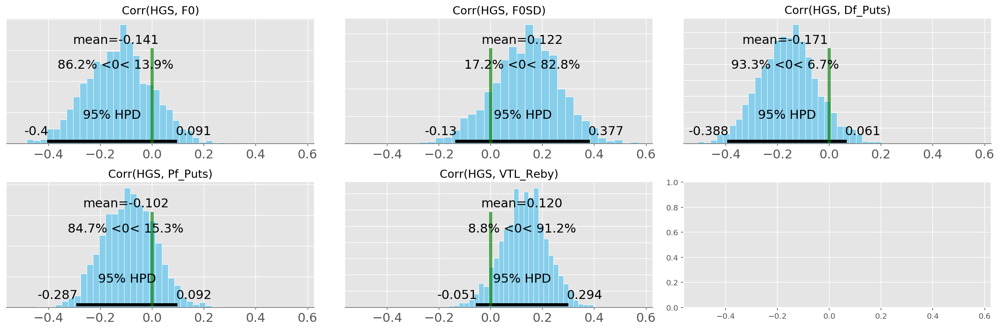

In [14]:
plotpost = pm.plots.artists.plot_posterior_op

_,  ax = plt.subplots(2, 3, figsize=(18, 6), sharex=True)
corrtrace = trace1['corr'][:, 0, :]
ax1 = ax.flatten()
for i, measure in enumerate(measure_labels):
    if i>0:
        trace_values = corrtrace[:, i]
        plotpost(trace_values, ax1[i-1], kde_plot=False, point_estimate='mean', bw=4,
                 round_to=3, alpha_level=0.05, ref_val=0., rope=None, color='#87ceeb')
        ax1[i-1].set_title('Corr('+measure_labels[0]+', '+measure+')')
plt.tight_layout();

### Check model fit by ploting the posterior prediction with the actual observed

In [15]:
ppc1 = pm.sample_ppc(trace1, model=mv_model1, samples=100)

100%|██████████| 100/100 [00:00<00:00, 269.15it/s]


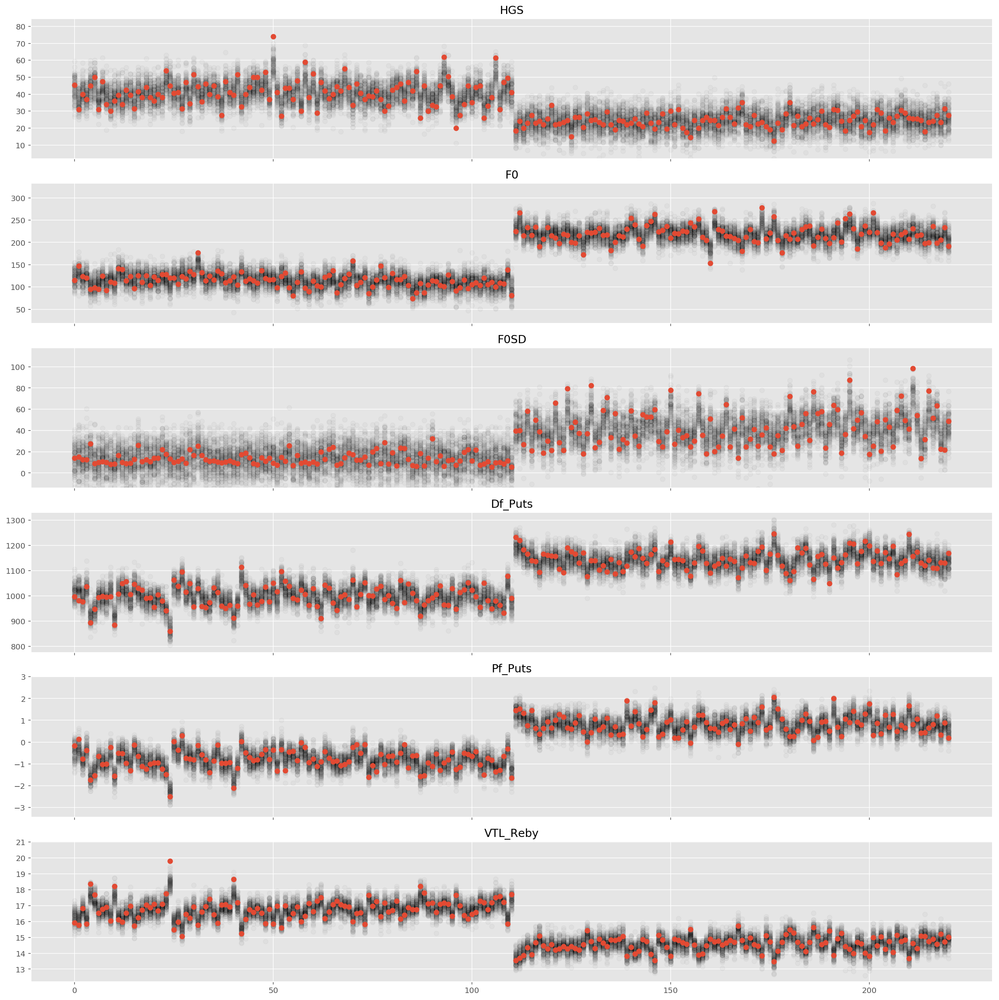

In [16]:
_, ax = plt.subplots(Nmeasure, 1, figsize=(18, 18), sharex=True)
for i in range(Nmeasure):
    ax[i].plot(ppc1['observed'][:,:,i].T, 'o', color='k', alpha=.025)
    ax[i].plot(datamat[:,i].T, 'o')
    ax[i].set_title(measure_labels[i])
    ax[i].set_ylim(datamat[:,i].min()-np.std(datamat[:,i]),
                   datamat[:,i].max()+np.std(datamat[:,i]))
plt.tight_layout();

In [17]:
CONVERGENCE_TITLE = lambda: 'BFMI = {a:.2f}\nmax(R_hat) = {b:.3f}\nmin(Eff_n) = {c:.3f}'\
                    .format(a=bfmi, b=max_gr, c=min_effn)
def get_diags(trace):
    bfmi = pm.bfmi(trace)
    max_gr = max(np.max(gr_stats) for gr_stats in pm.gelman_rubin(trace).values())
    min_effn = min(np.min(ef_stats) for ef_stats in pm.effective_n(trace).values())
    return bfmi, max_gr, min_effn

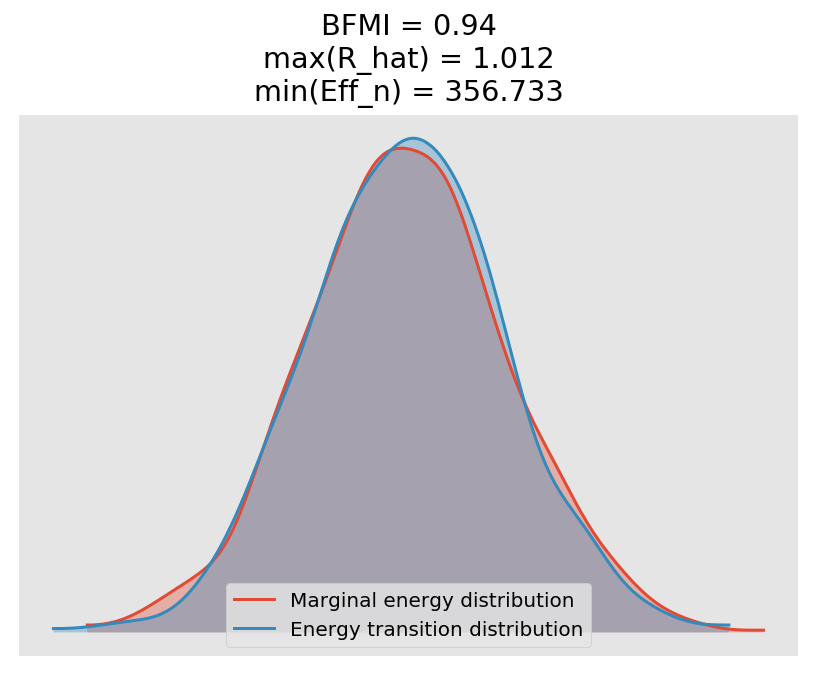

In [18]:
_, ax = plt.subplots(1, 1, figsize=(7, 5))

bfmi, max_gr, min_effn = get_diags(trace1)
(pm.energyplot(trace1, ax=ax)
   .set_title(CONVERGENCE_TITLE()));

In [19]:
import loo
df_loo1, pointwise1 = loo.loo(trace1, model=mv_model1)
df_loo1

Computed from 2000 by 1326 log-likelihood matrix


,Estimate,SE
elpd_loo,-3748.616594,74.149702
p_loo,440.196978,17.445799
looic,7497.233188,148.299404


Pareto k diagnostic values:
             Count        Pct           _
(-Inf, 0.5]    750  56.561086      (good)
 (0.5, 0.7]    437  32.956259        (ok)
   (0.7, 1]    131   9.879336       (bad)
   (1, Inf)      8   0.603318  (very bad)


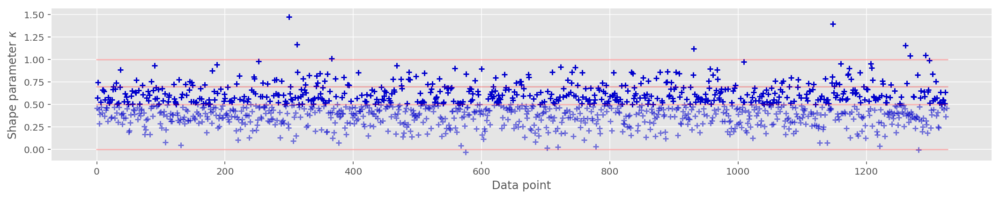

In [23]:
df_k = loo.ks_summary(pointwise1['ks'])
_, ax = plt.subplots(1, 1, figsize=(18, 3))
loo.plot_khat(pointwise1['ks'], ax=ax);

### Centered parameterization
Another parameterization of the same above model

In [20]:
X1 = {c:(tbl[c]
        .replace(dict(zip(tbl[c].unique(), np.arange(len(tbl[c].unique())))))
        .values) 
     for c in ['subgroup', 'ethnicity', 'sex']}

In [21]:
X1['subgroup']

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3,
       3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3,
       3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3,
       3])

In [22]:
Ng = len(np.unique(X1['subgroup']))
with pm.Model() as mv_model2:
    # prior for covariance
    sd_dist = pm.HalfNormal.dist(50)
    packed_chol = pm.LKJCholeskyCov('chol_cov', n=Nmeasure, eta=2, sd_dist=sd_dist)
    
    # compute the covariance and correlation matrix 
    chol = pm.expand_packed_triangular(Nmeasure, packed_chol, lower=True)
    cov = pm.Deterministic('cov', tt.dot(chol, chol.T))
    # Extract the standard deviations and rho
    sd = pm.Deterministic('sd', tt.sqrt(tt.diag(cov)))
    corr = pm.Deterministic('corr', tt.diag(sd**-1).dot(cov.dot(tt.diag(sd**-1))))
    
    mu = pm.Normal('mu', mu=datamat.mean(axis=0), sd=100., shape=(Ng, Nmeasure))
    mu_ = pm.Normal('mu_', mu=0., sd=1., shape=datamat.shape)
    mu_group = mu[X1['subgroup'], :] + tt.dot(chol, mu_.T).T
    
    # sd = pm.HalfNormal('sd', 5, shape=Nmeasure)
    
    # observed
    obs = pm.Normal('observed', mu=mu_group, sd=sd, observed=datamat)

In [23]:
with mv_model2:
    trace2 = pm.sample(1000, tune=2000)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [mu_, mu, chol_cov]
100%|██████████| 3000/3000 [00:31<00:00, 95.22it/s]
The number of effective samples is smaller than 25% for some parameters.


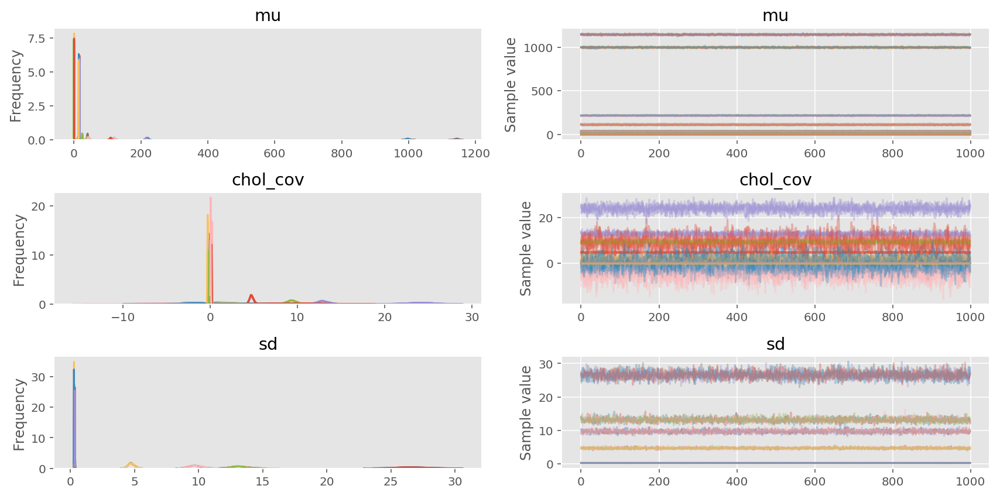

In [24]:
pm.traceplot(trace2, varnames=['mu', 'chol_cov', 'sd']);

In [25]:
pm.summary(trace2, varnames=['mu', 'chol_cov', 'sd']).round(3)

,mean,sd,mc_error,hpd_2.5,hpd_97.5,n_eff,Rhat
mu__0_0,41.143,0.932,0.019,39.393,43.053,2668.114,1.000
mu__0_1,119.652,2.623,0.055,114.560,124.695,2207.939,1.001
mu__0_2,13.088,1.877,0.031,9.283,16.696,3295.752,1.000
mu__0_3,996.226,5.268,0.103,986.125,1007.254,2195.949,1.000
mu__0_4,-0.805,0.056,0.001,-0.915,-0.696,2319.473,1.000
mu__0_5,16.656,0.069,0.001,16.517,16.784,2081.341,1.001
mu__1_0,40.646,0.881,0.015,38.911,42.316,2635.511,1.000
mu__1_1,109.806,2.483,0.042,104.767,114.496,2577.931,1.000
mu__1_2,13.572,1.770,0.031,10.110,17.014,2962.466,1.001
mu__1_3,997.585,4.966,0.092,987.847,1007.322,2316.671,1.000


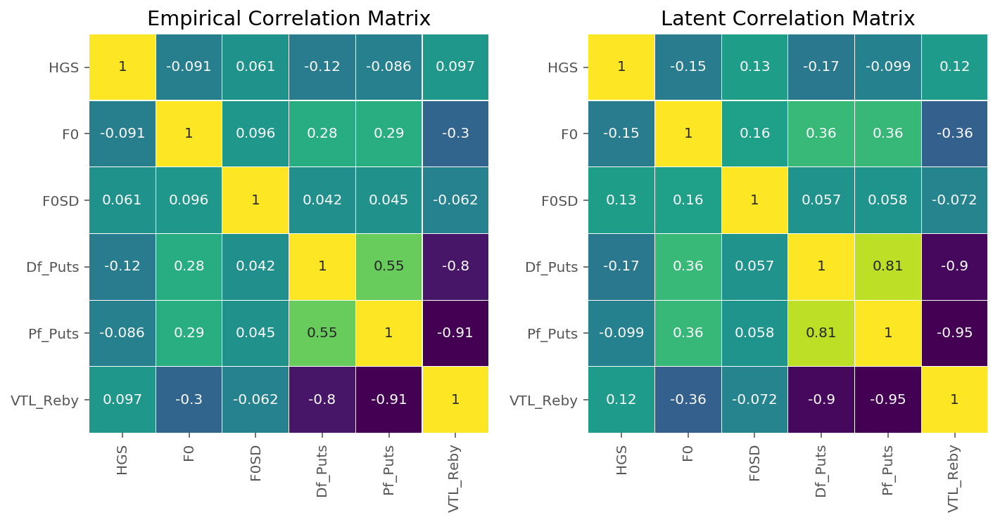

In [26]:
_, ax = plt.subplots(1, 2, figsize=(10, 5))

sns.heatmap(empirical_corr, 
            cbar=False, square = True, annot=True, 
            linewidths=.1, cmap='viridis', ax=ax[0])
ax[0].set_title('Empirical Correlation Matrix')

posterior_corr = pd.DataFrame(trace2['corr'].mean(axis=0),
                             columns=measure_labels,
                             index=measure_labels)
sns.heatmap(posterior_corr, 
            cbar=False, square = True, annot=True, 
            linewidths=.1, cmap='viridis', ax=ax[1])
ax[1].set_title('Latent Correlation Matrix')

plt.tight_layout();

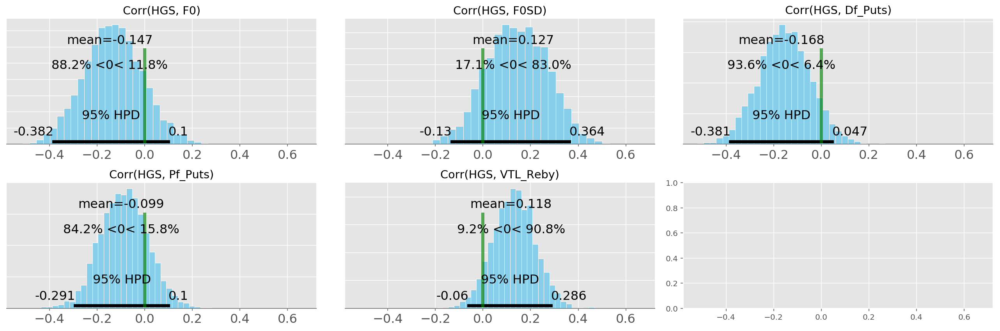

In [27]:
_,  ax = plt.subplots(2, 3, figsize=(18, 6), sharex=True)
corrtrace = trace2['corr'][:, 0, :]
ax1 = ax.flatten()
for i, measure in enumerate(measure_labels):
    if i>0:
        trace_values = corrtrace[:, i]
        plotpost(trace_values, ax1[i-1], kde_plot=False, point_estimate='mean', bw=4,
                 round_to=3, alpha_level=0.05, ref_val=0., rope=None, color='#87ceeb')
        ax1[i-1].set_title('Corr('+measure_labels[0]+', '+measure+')')
plt.tight_layout();

In [28]:
ppc2 = pm.sample_ppc(trace2, model=mv_model2, samples=100)

100%|██████████| 100/100 [00:00<00:00, 815.77it/s]


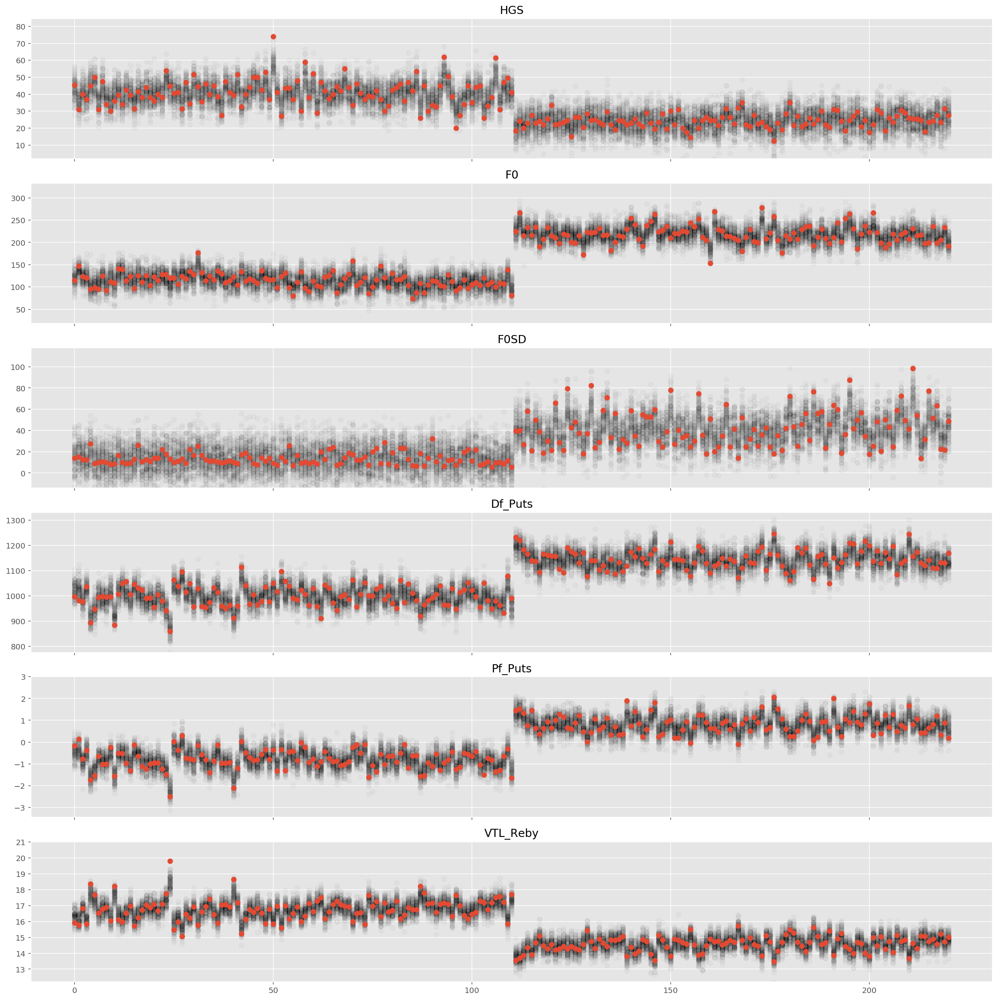

In [29]:
_, ax = plt.subplots(Nmeasure, 1, figsize=(18, 18), sharex=True)
for i in range(Nmeasure):
    ax[i].plot(ppc2['observed'][:,:,i].T, 'o', color='k', alpha=.025)
    ax[i].plot(datamat[:,i].T, 'o')
    ax[i].set_title(measure_labels[i])
    ax[i].set_ylim(datamat[:,i].min()-np.std(datamat[:,i]),
                   datamat[:,i].max()+np.std(datamat[:,i]))
plt.tight_layout();

## Compare models

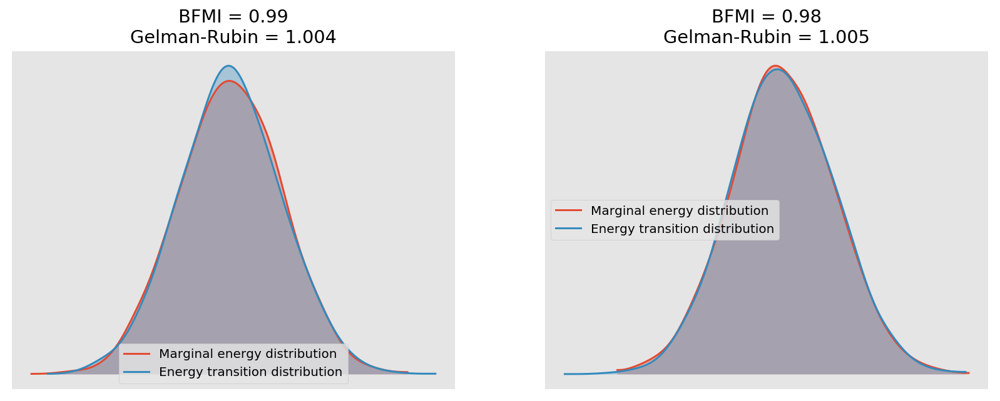

In [30]:
CONVERGENCE_TITLE = lambda: 'BFMI = {a:.2f}\nGelman-Rubin = {b:.3f}'.format(a=bfmi, b=max_gr)

_, ax = plt.subplots(1, 2, figsize=(14, 5))

bfmi = pm.bfmi(trace1)
max_gr = max(np.max(gr_stats) for gr_stats in pm.gelman_rubin(trace1).values())
(pm.energyplot(trace1, ax=ax[0])
   .set_title(CONVERGENCE_TITLE()));

bfmi = pm.bfmi(trace2)
max_gr = max(np.max(gr_stats) for gr_stats in pm.gelman_rubin(trace2).values())
(pm.energyplot(trace2, ax=ax[1])
   .set_title(CONVERGENCE_TITLE()));

In [31]:
MODEL_NAME_MAP = {
    0: "model1",
    1: "model2"
}

model_dict = {mv_model1: trace1,
              mv_model2: trace2}
comp_df = (pm.compare(model_dict,
                      ic='LOO')
             .rename(index=MODEL_NAME_MAP)
             .loc[MODEL_NAME_MAP.values()])

comp_df

/home/laoj/Documents/Github/pymc3/pymc3/stats.py:292: UserWarning: Estimated shape parameter of Pareto distribution is
        greater than 0.7 for one or more samples.
        You should consider using a more robust model, this is because
        importance sampling is less likely to work well if the marginal
        posterior and LOO posterior are very different. This is more likely to
        happen with a non-robust model and highly influential observations.
  happen with a non-robust model and highly influential observations.""")
/home/laoj/Documents/Github/pymc3/pymc3/stats.py:292: UserWarning: Estimated shape parameter of Pareto distribution is
        greater than 0.7 for one or more samples.
        You should consider using a more robust model, this is because
        importance sampling is less likely to work well if the marginal
        posterior and LOO posterior are very different. This is more likely to
        happen with a non-robust model and highly influential observ

,LOO,pLOO,dLOO,weight,SE,dSE,shape_warn
model1,7516.62,450.2,6.02,0,149.31,5.13,1
model2,7510.59,448.51,0,1,148.99,0,1


The two parameterization is pretty much identical

### Centered parameterization with robust option
Observing from the result above, it seems some of the observation (i.e., red dots) are outside of the gray area (i.e., predicted value using posterior prediction check). Maybe modeling the observed using a student-T distribution would be more robust and taken these value into account.

In [32]:
with pm.Model() as mv_model2r:
    # prior for covariance
    sd_dist = pm.HalfNormal.dist(50)
    packed_chol = pm.LKJCholeskyCov('chol_cov', n=Nmeasure, eta=2, sd_dist=sd_dist)
    
    # compute the covariance and correlation matrix 
    chol = pm.expand_packed_triangular(Nmeasure, packed_chol, lower=True)
    cov = pm.Deterministic('cov', tt.dot(chol, chol.T))
    # Extract the standard deviations and rho
    sd = pm.Deterministic('sd', tt.sqrt(tt.diag(cov)))
    corr = pm.Deterministic('corr', tt.diag(sd**-1).dot(cov.dot(tt.diag(sd**-1))))
    
    mu = pm.Normal('mu', mu=datamat.mean(axis=0), sd=100., shape=(Ng, Nmeasure))
    mu_ = pm.Normal('mu_', mu=0., sd=1., shape=datamat.shape)
    mu_group = mu[X1['subgroup'], :] + tt.dot(chol, mu_.T).T
    
    # define prior for Student T degrees of freedom
    nu = pm.HalfNormal('nu', 10., shape=Nmeasure)

    # Likelihood (robust to outliner using t-distribution)
    obs = pm.StudentT('observed', mu=mu_group, sd=sd, nu=nu, observed=datamat)

    trace2r = pm.sample(1000, tune=2000)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [nu, mu_, mu, chol_cov]
100%|██████████| 3000/3000 [00:41<00:00, 73.08it/s]
The number of effective samples is smaller than 10% for some parameters.


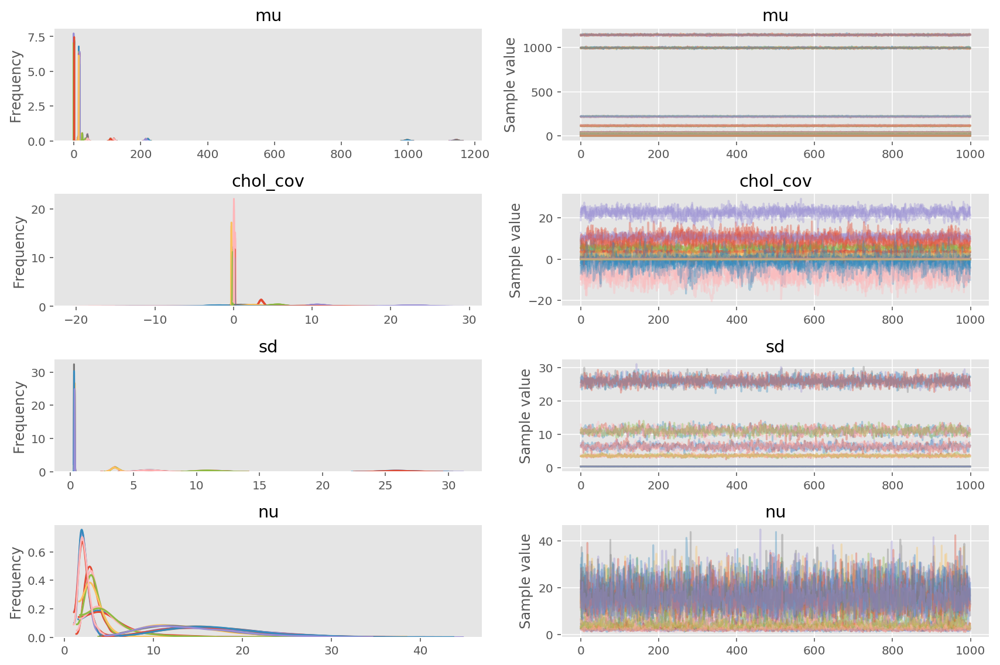

In [33]:
pm.traceplot(trace2r, varnames=['mu', 'chol_cov', 'sd', 'nu']);

In [34]:
pm.summary(trace2r, varnames=['mu', 'chol_cov', 'sd']).round(3)

,mean,sd,mc_error,hpd_2.5,hpd_97.5,n_eff,Rhat
mu__0_0,40.490,0.849,0.019,38.753,42.101,2083.963,1.001
mu__0_1,119.382,2.352,0.047,114.929,124.000,2015.280,1.000
mu__0_2,12.911,1.305,0.026,10.426,15.541,2277.042,1.000
mu__0_3,996.247,5.215,0.109,986.453,1006.803,2173.667,1.001
mu__0_4,-0.801,0.055,0.001,-0.909,-0.693,2149.771,1.000
mu__0_5,16.623,0.069,0.001,16.493,16.757,2042.735,1.000
mu__1_0,40.535,0.883,0.017,38.836,42.242,2909.327,1.001
mu__1_1,109.618,2.259,0.046,105.388,114.197,2385.222,1.000
mu__1_2,13.300,1.281,0.027,10.683,15.694,2765.602,1.000
mu__1_3,997.275,4.940,0.096,987.238,1006.650,2284.286,1.000


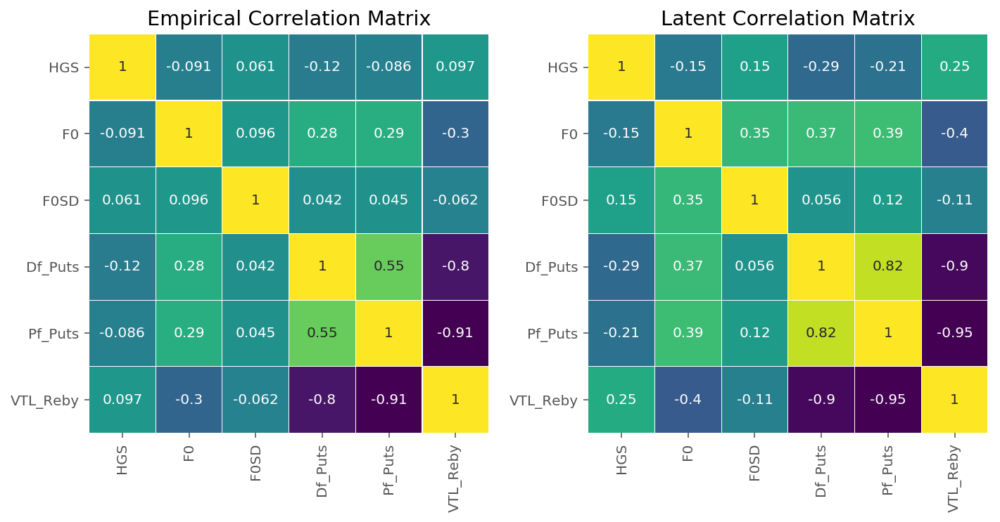

In [35]:
_, ax = plt.subplots(1, 2, figsize=(10, 5))

sns.heatmap(empirical_corr, 
            cbar=False, square = True, annot=True, 
            linewidths=.1, cmap='viridis', ax=ax[0])
ax[0].set_title('Empirical Correlation Matrix')

posterior_corr = pd.DataFrame(trace2r['corr'].mean(axis=0),
                             columns=measure_labels,
                             index=measure_labels)
sns.heatmap(posterior_corr, 
            cbar=False, square = True, annot=True, 
            linewidths=.1, cmap='viridis', ax=ax[1])
ax[1].set_title('Latent Correlation Matrix')

plt.tight_layout();

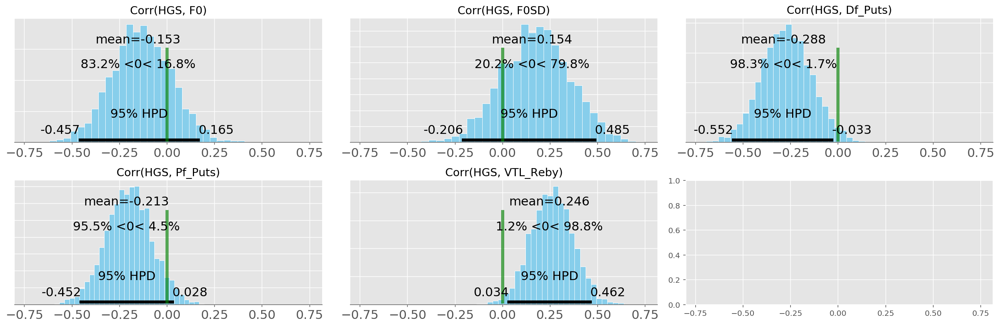

In [36]:
_,  ax = plt.subplots(2, 3, figsize=(18, 6), sharex=True)
corrtrace = trace2r['corr'][:, 0, :]
ax1 = ax.flatten()
for i, measure in enumerate(measure_labels):
    if i>0:
        trace_values = corrtrace[:, i]
        plotpost(trace_values, ax1[i-1], kde_plot=False, point_estimate='mean', bw=4,
                 round_to=3, alpha_level=0.05, ref_val=0., rope=None, color='#87ceeb')
        ax1[i-1].set_title('Corr('+measure_labels[0]+', '+measure+')')
plt.tight_layout();

In [37]:
ppc2r = pm.sample_ppc(trace2r, model=mv_model2r, samples=100)

100%|██████████| 100/100 [00:00<00:00, 831.00it/s]


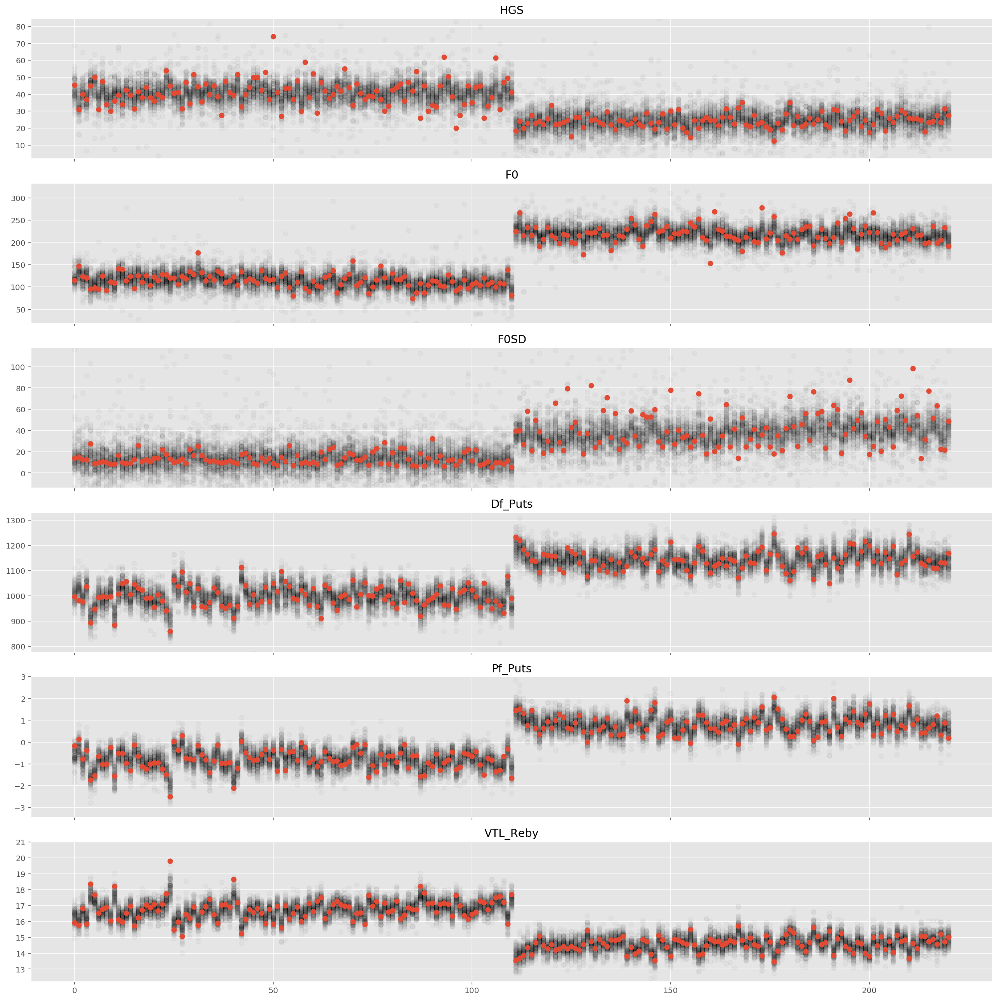

In [38]:
_, ax = plt.subplots(Nmeasure, 1, figsize=(18, 18), sharex=True)
for i in range(Nmeasure):
    ax[i].plot(ppc2r['observed'][:,:,i].T, 'o', color='k', alpha=.025)
    ax[i].plot(datamat[:,i].T, 'o')
    ax[i].set_title(measure_labels[i])
    ax[i].set_ylim(datamat[:,i].min()-np.std(datamat[:,i]),
                   datamat[:,i].max()+np.std(datamat[:,i]))
plt.tight_layout();

## Compare models

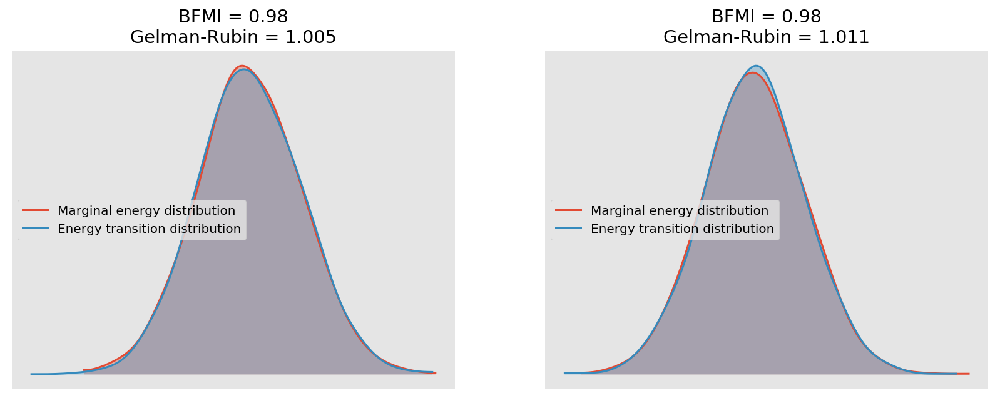

In [39]:
_, ax = plt.subplots(1, 2, figsize=(14, 5))

bfmi = pm.bfmi(trace2)
max_gr = max(np.max(gr_stats) for gr_stats in pm.gelman_rubin(trace2).values())
(pm.energyplot(trace2, ax=ax[0])
   .set_title(CONVERGENCE_TITLE()));

bfmi = pm.bfmi(trace2r)
max_gr = max(np.max(gr_stats) for gr_stats in pm.gelman_rubin(trace2r).values())
(pm.energyplot(trace2r, ax=ax[1])
   .set_title(CONVERGENCE_TITLE()));

In [40]:
MODEL_NAME_MAP = {
    0: "model1",
    1: "model2",
    2: "model2r"
}

model_dict2 = {mv_model1: trace1,
               mv_model2: trace2,
               mv_model2r: trace2r}
comp_df = (pm.compare(model_dict2, ic='LOO')
             .rename(index=MODEL_NAME_MAP)
             .loc[MODEL_NAME_MAP.values()])

comp_df

/home/laoj/Documents/Github/pymc3/pymc3/stats.py:292: UserWarning: Estimated shape parameter of Pareto distribution is
        greater than 0.7 for one or more samples.
        You should consider using a more robust model, this is because
        importance sampling is less likely to work well if the marginal
        posterior and LOO posterior are very different. This is more likely to
        happen with a non-robust model and highly influential observations.
  happen with a non-robust model and highly influential observations.""")
/home/laoj/Documents/Github/pymc3/pymc3/stats.py:292: UserWarning: Estimated shape parameter of Pareto distribution is
        greater than 0.7 for one or more samples.
        You should consider using a more robust model, this is because
        importance sampling is less likely to work well if the marginal
        posterior and LOO posterior are very different. This is more likely to
        happen with a non-robust model and highly influential observ

,LOO,pLOO,dLOO,weight,SE,dSE,shape_warn
model1,7516.62,450.2,6.02,0,149.31,5.13,1
model2,7510.59,448.51,0,0.6,148.99,0,1
model2r,7522.94,418.99,12.34,0.4,149.18,20,1


As shown from the posterior predictive check and the LOO model comparison, adding a robust option for potential outliner do not improve the model.

## Compare with a bootstrap distribution from a frequentist estimator

In [41]:
nboot = 4000
corr_boot = np.zeros_like(trace1['corr'])
for ib in range(nboot):
    boot_idx = np.random.choice(nsbj, nsbj)
    corr_boot[ib, :, :] = np.corrcoef(data_demean[boot_idx, :].T)

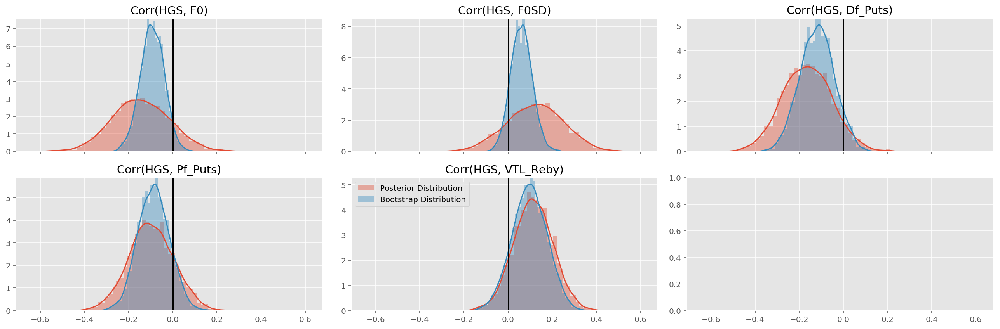

In [42]:
_,  ax = plt.subplots(2, 3, figsize=(18, 6), sharex=True)
ax1 = ax.flatten()
for i, measure in enumerate(measure_labels):
    if i>0:
        val1 = trace1['corr'][:, 0, i]
        sns.distplot(val1, kde=True, ax=ax1[i-1],
                         label='Posterior Distribution')
        val2 = corr_boot[:, 0, i]
        sns.distplot(val2, kde=True, ax=ax1[i-1],
                         label='Bootstrap Distribution')
        ax1[i-1].set_title('Corr('+measure_labels[0]+', '+measure+')')
        ax1[i-1].axvline(0, color='k')
ax1[i-1].legend()
plt.tight_layout();

# Model on z-scored space

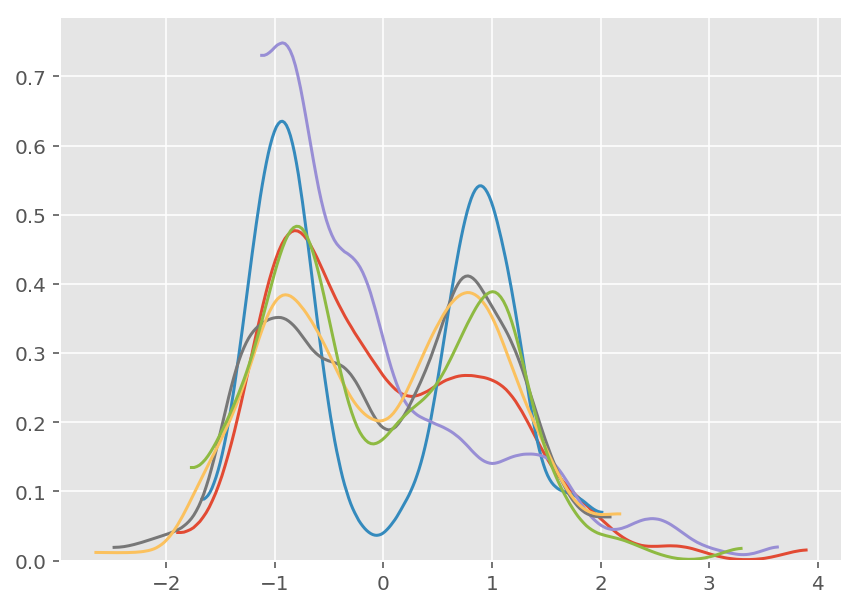

In [43]:
datamat_z = (datamat-datamat.mean(axis=0, keepdims=True))/datamat.std(axis=0, keepdims=True)
_, ax = plt.subplots(1, 1, figsize=(7, 5))
for i in range(datamat_z.shape[1]):
    pm.plots.kdeplot(datamat_z.T[i], ax=ax);

In [44]:
with pm.Model() as mv_modelz:
    # prior for covariance
    sd_dist = pm.HalfNormal.dist(5)
    packed_chol = pm.LKJCholeskyCov('chol_cov', n=Nmeasure, eta=1, sd_dist=sd_dist)
    
    # compute the covariance and correlation matrix 
    chol = pm.expand_packed_triangular(Nmeasure, packed_chol, lower=True)
    cov = pm.Deterministic('cov', tt.dot(chol, chol.T))
    # Extract the standard deviations and rho
    sd = pm.Deterministic('sd', tt.sqrt(tt.diag(cov)))
    corr = pm.Deterministic('corr', tt.diag(sd**-1).dot(cov.dot(tt.diag(sd**-1))))
    
    beta = pm.Normal('beta', mu=0., sd=1., shape=(npredi, Nmeasure))
    # observed
    obs = pm.MvNormal('observed', 
                      mu=tt.dot(X, beta),
                      chol=chol, 
                      observed=datamat_z)
    
    tracez = pm.sample(1000, tune=2000,
#                        nuts_kwargs=dict(target_accept=.95, max_treedepth=15)
                      )

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [beta, chol_cov]
100%|██████████| 3000/3000 [02:34<00:00, 19.43it/s]


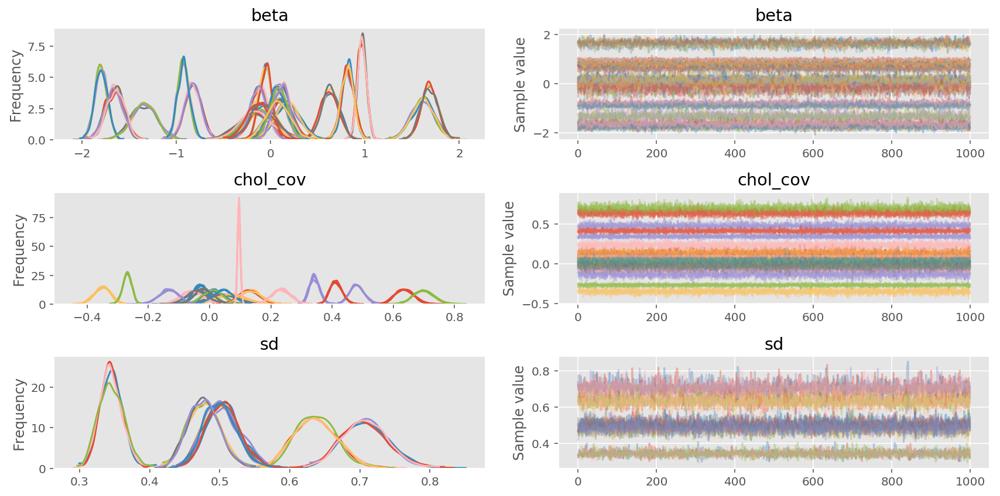

In [45]:
pm.traceplot(tracez, varnames=['beta', 'chol_cov', 'sd']);

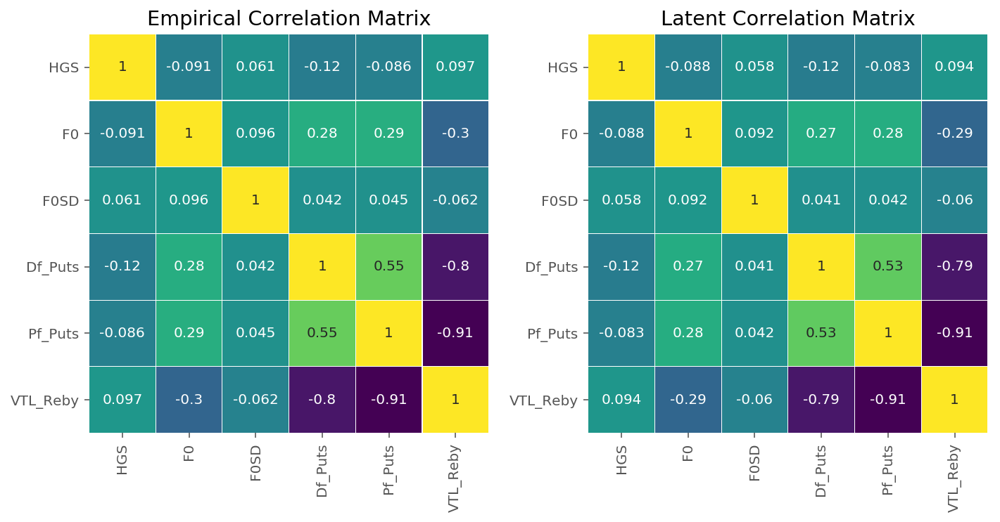

In [46]:
_, ax = plt.subplots(1, 2, figsize=(10, 5))

sns.heatmap(empirical_corr, 
            cbar=False, square = True, annot=True, 
            linewidths=.1, cmap='viridis', ax=ax[0])
ax[0].set_title('Empirical Correlation Matrix')

posterior_corr = pd.DataFrame(tracez['corr'].mean(axis=0),
                              columns=measure_labels,
                              index=measure_labels)
sns.heatmap(posterior_corr, 
            cbar=False, square = True, annot=True, 
            linewidths=.1, cmap='viridis', ax=ax[1])
ax[1].set_title('Latent Correlation Matrix')

plt.tight_layout();

### Posterior distribution of the cross correlation
Similar conclusion to the paper could be drawn: the posterior distributions of the correlations overlap with zero.

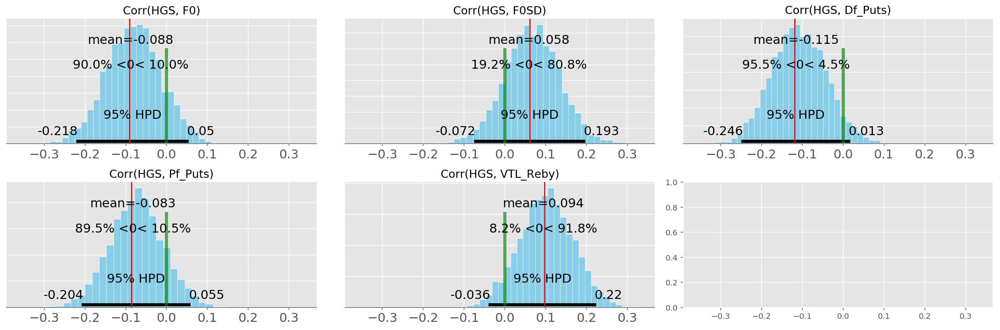

In [47]:
_,  ax = plt.subplots(2, 3, figsize=(18, 6), sharex=True)
corrtrace = tracez['corr'][:, 0, :]
ax1 = ax.flatten()
for i, measure in enumerate(measure_labels):
    if i>0:
        trace_values = corrtrace[:, i]
        plotpost(trace_values, ax1[i-1], kde_plot=False, point_estimate='mean', bw=4,
                 round_to=3, alpha_level=0.05, ref_val=0., rope=None, color='#87ceeb')
        ax1[i-1].axvline(empirical_corr.values[0, i], color='r')
        ax1[i-1].set_title('Corr('+measure_labels[0]+', '+measure+')')
plt.tight_layout();

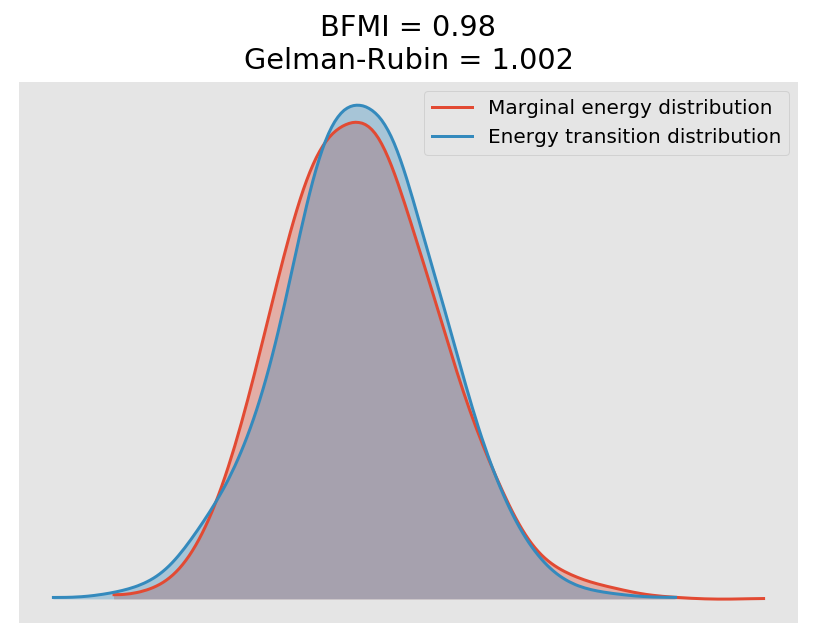

In [48]:
_, ax = plt.subplots(1, 1, figsize=(7, 5))

bfmi, max_gr, min_effn = get_diags(tracez)
(pm.energyplot(tracez, ax=ax)
   .set_title(CONVERGENCE_TITLE()));

## Compare with a bootstrap distribution from a frequentist estimator

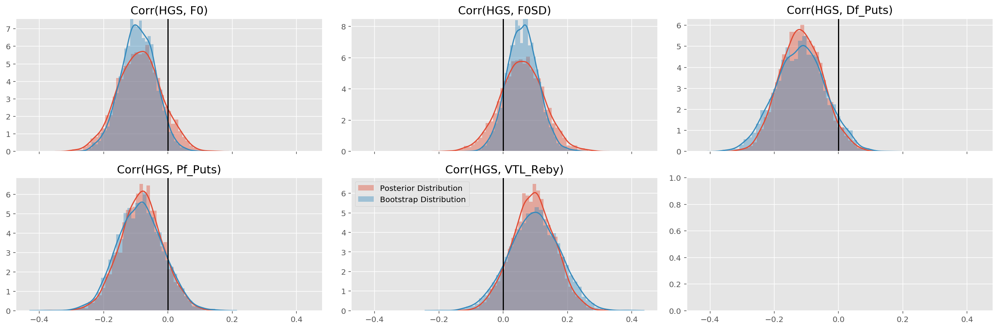

In [49]:
_,  ax = plt.subplots(2, 3, figsize=(18, 6), sharex=True)
ax1 = ax.flatten()
for i, measure in enumerate(measure_labels):
    if i>0:
        val1 = tracez['corr'][:, 0, i]
        sns.distplot(val1, kde=True, ax=ax1[i-1],
                         label='Posterior Distribution')
        val2 = corr_boot[:, 0, i]
        sns.distplot(val2, kde=True, ax=ax1[i-1],
                         label='Bootstrap Distribution')
        ax1[i-1].set_title('Corr('+measure_labels[0]+', '+measure+')')
        ax1[i-1].axvline(0, color='k')
ax1[i-1].legend()
plt.tight_layout();

# To do:
- Investigate why there are k-hat warnings, and plot the elpd_i value.
- The elpd is estimated not for each element, it would be cool to implement [the solution in `loo`](http://mc-stan.org/loo/articles/loo2-non-factorizable.html)